In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import json
import subprocess
from scipy.misc import imread, imresize
%matplotlib inline

from train import build_forward
from utils import googlenet_load, train_utils
from utils.annolist import AnnotationLib as al
#from utils.stitch_wrapper import stitch_rects
from utils.train_utils import add_rectangles
from utils.rect import Rect
from evaluate import add_rectangles
import cv2
import numpy as np
import sys
import os

In [2]:
hypes_file = './hypes/overfeat_rezoom.json'
iteration = 150000
with open(hypes_file, 'r') as f:
    H = json.load(f)
true_idl = './data/brainwash/brainwash_val.idl'
pred_idl = './output/%d_val_%s.idl' % (iteration, os.path.basename(hypes_file).replace('.json', ''))
true_annos = al.parse(true_idl)

0


100


200


300


400


4.829322 images/sec


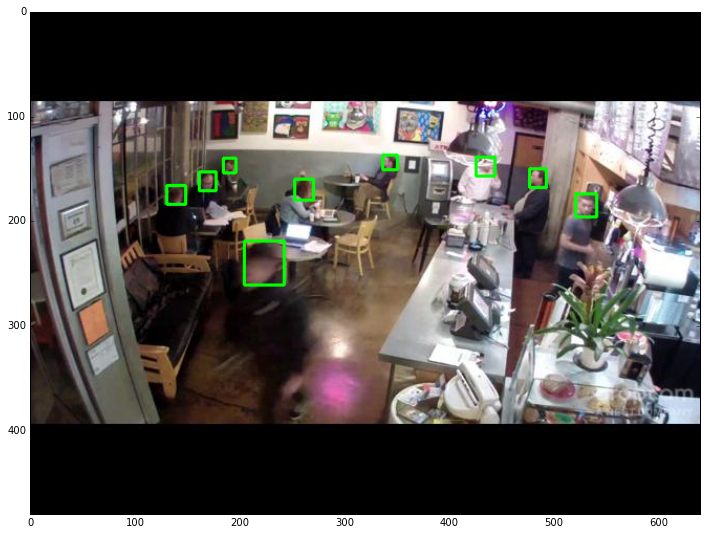

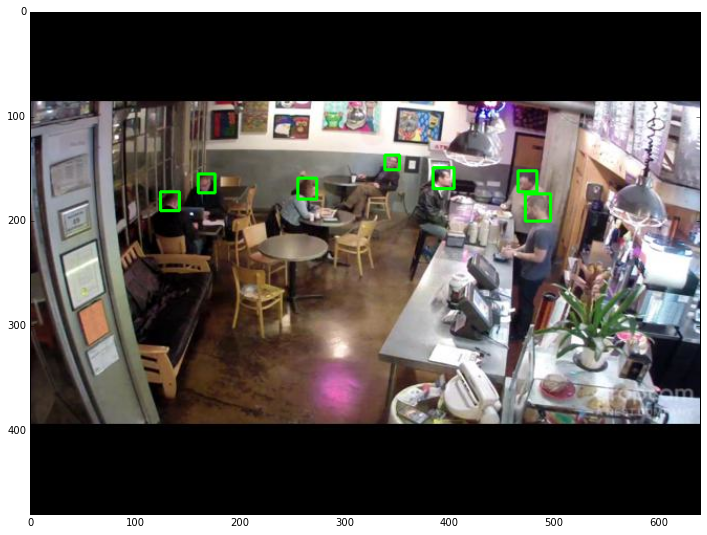

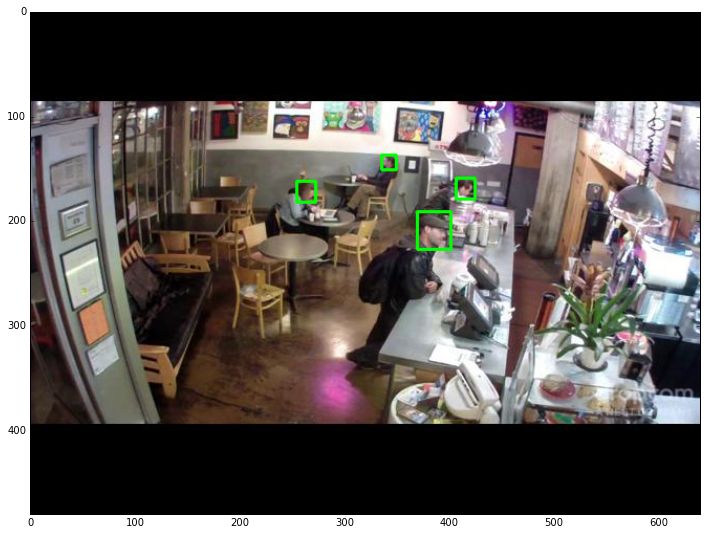

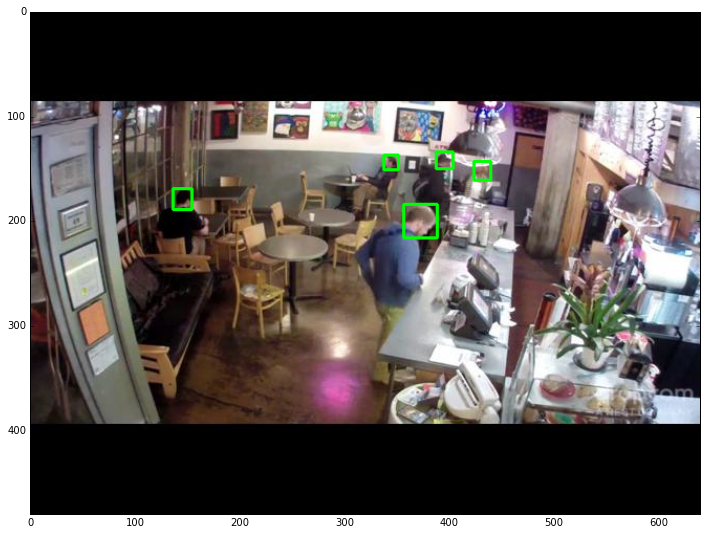

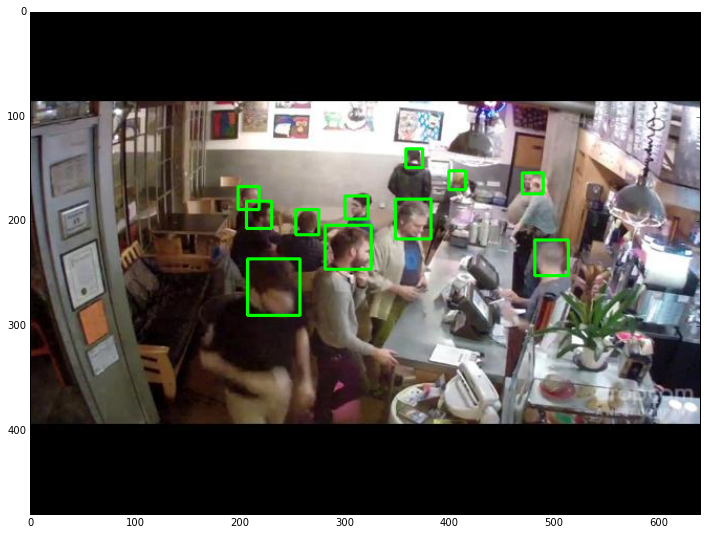

...

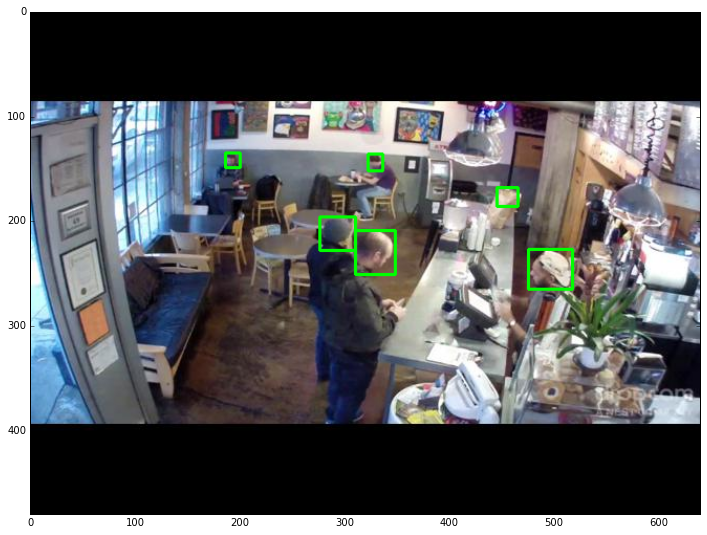

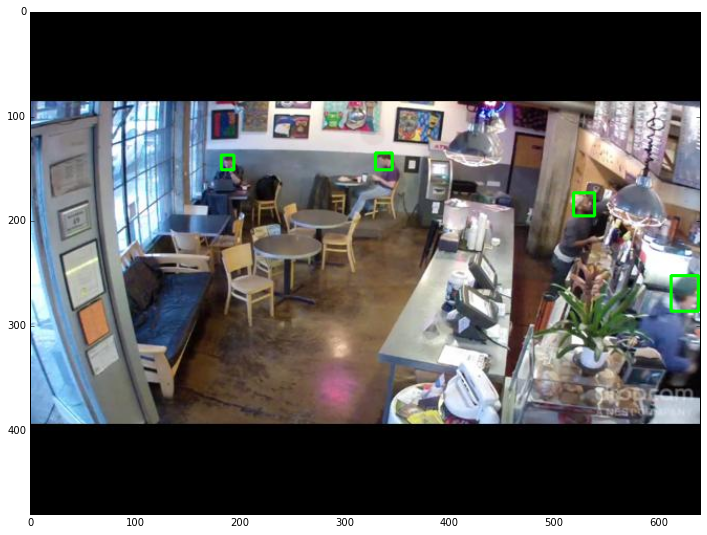

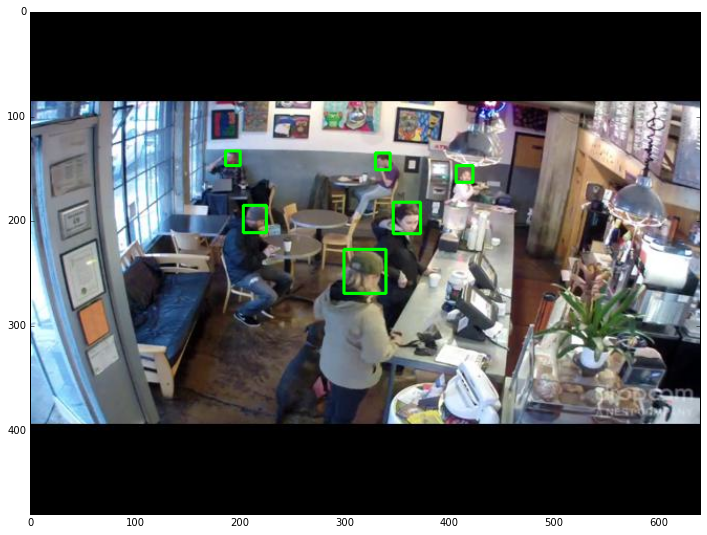

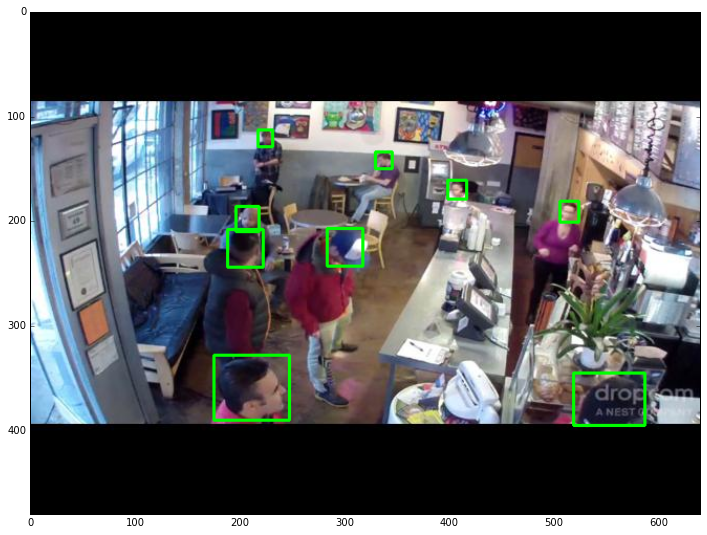

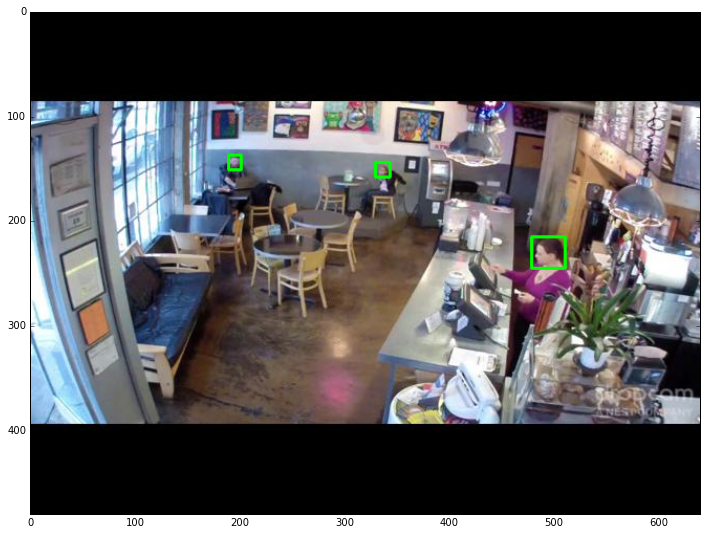

In [3]:
tf.reset_default_graph()
googlenet = googlenet_load.init(H)
x_in = tf.placeholder(tf.float32, name='x_in', shape=[H['arch']['image_height'], H['arch']['image_width'], 3])
if H['arch']['use_rezoom']:
    pred_boxes, pred_logits, pred_confidences, pred_confs_deltas, pred_boxes_deltas = build_forward(H, tf.expand_dims(x_in, 0), googlenet, 'test', reuse=None)
    grid_area = H['arch']['grid_height'] * H['arch']['grid_width']
    pred_confidences = tf.reshape(tf.nn.softmax(tf.reshape(pred_confs_deltas, [grid_area * H['arch']['rnn_len'], 2])), [grid_area, H['arch']['rnn_len'], 2])
    if H['arch']['reregress']:
        pred_boxes = pred_boxes + pred_boxes_deltas
else:
    pred_boxes, pred_logits, pred_confidences = build_forward(H, tf.expand_dims(x_in, 0), googlenet, 'test', reuse=None)
saver = tf.train.Saver()
with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    saver.restore(sess, './data/overfeat_rezoom/save.ckpt-%d' % iteration)

    annolist = al.AnnoList()
    import time; t = time.time()
    for i in range(0, 500):
        true_anno = true_annos[i]
        img = imread('./data/brainwash/%s' % true_anno.imageName)
        feed = {x_in: img}
        (np_pred_boxes, np_pred_confidences) = sess.run([pred_boxes, pred_confidences], feed_dict=feed)
        pred_anno = al.Annotation()
        pred_anno.imageName = true_anno.imageName
        new_img, rects = add_rectangles(H, [img], np_pred_confidences, np_pred_boxes,
                                        H["arch"], use_stitching=True, rnn_len=H['arch']['rnn_len'], min_conf=0.3)
    
        pred_anno.rects = rects
        annolist.append(pred_anno)

        if i % 10 == 0 and i < 200:
            pass
            fig = plt.figure(figsize=(12, 12))
            plt.imshow(new_img)
        if i % 100 == 0:
            print(i)
    avg_time = (time.time() - t) / (i + 1)
    print('%f images/sec' % (1. / avg_time))

In [5]:
annolist.save(pred_idl)
iou_threshold = 0.5
filename = "./utils/annolist/doRPC.py"
args = ['--minOverlap '+str(iou_threshold), true_idl, pred_idl]
print("running utils/annolist/doRPC.py",args)
%run $filename {args[0]} {args[1]} {args[2]}

saving:  ./output/150000_val_overfeat_rezoom.idl
running utils/annolist/doRPC.py ['--minOverlap 0.5', './data/brainwash/brainwash_val.idl', './output/150000_val_overfeat_rezoom.idl']
Minimum width: 0 height: 0


Asorting too large/ too small detections
minWidth: 0
minHeight: 0
maxWidth:  inf
maxHeight:  inf


#Annotations: 3318
Setting up graphs ...


missingFrames:  0
Number of detections on annotated frames:  4739
Sorting scores ...
Gradually decrease score ...


saving:
/home/acerekovic/code/TensorBox/output/rpc-150000_val_overfeat_rezoom_overlap0.5.txt


running utils/annolist/plotSimple.py %s ('./output/rpc-150000_val_overfeat_rezoom_overlap0.5.txt', '--output output/results.png')
Plotting: ./output/rpc-150000_val_overfeat_rezoom_overlap0.5.txt
lowest_fppi:  -26
90 percent precision score: 0.001032, recall: 0.000
0.000000 fppi score: inf, recall: 0.000
0.050000 fppi score: 0.137629, recall: 0.022
0.100000 fppi score: 0.001014, recall: 0.043
0.150000 fppi score: 0.007984, recall: 0.061
0.200000 fppi score: 0.001167, recall: 0.084
0.250000 fppi score: 0.001896, recall: 0.101
0.300000 fppi score: 0.022349, recall: 0.102
0.350000 fppi score: 0.142764, recall: 0.106
0.400000 fppi score: 0.224891, recall: 0.112
0.450000 fppi score: 0.086730, recall: 0.117
0.500000 fppi score: 0.209830, recall: 0.126
0.550000 fppi score: 0.245399, recall: 0.135
0.600000 fppi score: 0.354461, recall: 0.142
0.650000 fppi score: 0.679370, recall: 0.152
0.700000 fppi score: 0.223156, recall: 0.159
0.750000 fppi score: 0.345738, recall: 0.167
0.800000 fppi score:

/opt/anaconda3/lib/python3.5/site-packages/matplotlib/legend.py:633: UserWarning: Legend does not support './output/rpc-150000_val_overfeat_rezoom_overlap0.5.txt' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#using-proxy-artist
  "#using-proxy-artist".format(orig_handle)


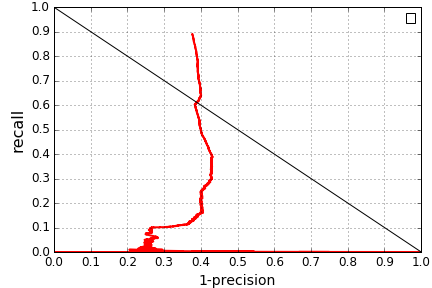

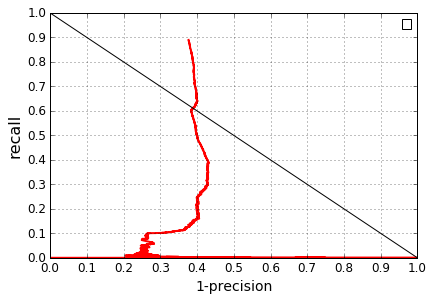

In [6]:
filename2 = './utils/annolist/plotSimple.py'
txt_file = './output/rpc-150000_val_overfeat_rezoom_overlap0.5.txt'
output_png = 'output/results.png'
args2 = (txt_file, '--output ' + str(output_png))
print("running utils/annolist/plotSimple.py %s",args2)
%run $filename2 {args2[0]} {args2[1]} 
from IPython.display import Image
Image(filename=output_png)

#NOTE, updated matplot lib does not work properly
#TO DO, check how we can modify plotting in utils/annolist/MatPotter.py to get the same graph as in evaluate.ipynb